In [50]:
import re
import os
import string
import pandas as pd
import numpy as np
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, precision_recall_fscore_support, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
from datasets import Dataset
import torch
import seaborn as sns
import random
from torch.nn import CrossEntropyLoss
from torch.utils.data import WeightedRandomSampler, DataLoader
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

import optuna
import ray
from ray import tune
from ray.tune.schedulers import ASHAScheduler
from ray.tune import CLIReporter

from bertviz import model_view, head_view

In [51]:
def set_seed(seed):
    # Set the seed for Python random module
    random.seed(seed)
    # Set the seed for NumPy
    np.random.seed(seed)
    # Set the seed for PyTorch
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # For multi-GPU
    torch.backends.cudnn.deterministic = True  # Ensures deterministic behavior
    torch.backends.cudnn.benchmark = False 

In [52]:
df = pd.read_csv('longerdataset.csv')
data = df.iloc[:,1:3]
dataset = Dataset.from_pandas(data)

In [53]:
seed = 123
set_seed(seed)
batch_size =32

In [54]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-multilingual-cased")
model = AutoModelForSequenceClassification.from_pretrained("bert-base-multilingual-cased", num_labels=2)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-multilingual-cased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [55]:
def tokenize_function(examples):
    return tokenizer(
        examples["text_comments"],  # Adjust the key to match your dataset
        padding="max_length",
        truncation=True,
        max_length=50
    )

# Tokenize dataset
tokenized_dataset = dataset.map(tokenize_function, batched=True)

# Rename the label column for compatibility
tokenized_dataset = tokenized_dataset.rename_column("label", "labels")

# Set dataset format for PyTorch
tokenized_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

# Train-validation-test split
train_val_split = tokenized_dataset.train_test_split(test_size=0.2, seed=seed)
train_split = train_val_split["train"].train_test_split(test_size=0.25, seed=seed)

# Assign splits
train_dataset = train_split["train"]
val_dataset = train_split["test"]
test_dataset = train_val_split["test"]

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

In [56]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = logits.argmax(axis=-1)  # Get predicted class

    # Calculate precision, recall, F1, and accuracy
    precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, average="weighted", zero_division=0)
    acc = accuracy_score(labels, predictions)

    return {
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }

In [57]:
train_labels = np.array(train_dataset['labels'])

# Get all unique classes in the dataset
unique_classes = np.unique(train_labels)
class_weights = compute_class_weight(class_weight='balanced', classes=unique_classes, y=train_labels)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)

In [58]:
# Assuming class_weights is a tensor on the GPU
class_weights_cpu = class_weights.cpu()  # Move the tensor to CPU

# Assign a weight to each sample based on its class
sample_weights = np.array([class_weights_cpu[label].item() for label in train_labels])  # Convert each weight to a scalar and then to a numpy array
generator = torch.Generator().manual_seed(seed)
# Create a sampler using these weights
sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True,generator=generator)


In [59]:
train_dataloader = DataLoader(
    train_dataset,
    sampler=sampler,
    batch_size=batch_size
)

In [60]:
class CustomTrainer(Trainer):
    def __init__(self, *args, class_weights=None, sampler=None, seed=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = class_weights  # Store the class weights
        self.sampler = sampler  # Store the sampler
        self.seed = seed  # Store the seed

    def get_train_dataloader(self):
    # Override this method to pass the sampler into the DataLoader
    # Use the sampler created earlier with the fixed seed generator
        train_dataloader = DataLoader(
        self.train_dataset,
        batch_size=self.args.train_batch_size,
        sampler=self.sampler,  # Pass the sampler here (which already uses the fixed generator)
    )
        return train_dataloader

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=None):
        # Forward pass through the model
        labels = inputs.get("labels")
        outputs = model(**inputs)
        logits = outputs.logits
        
        # Get the number of labels from model config
        num_labels = model.config.num_labels
        
        # Apply the loss function with class weights
        loss_fct = torch.nn.CrossEntropyLoss(weight=self.class_weights)
        loss = loss_fct(logits.view(-1, num_labels), labels.view(-1))

        return (loss, outputs) if return_outputs else loss

In [ ]:
training_args = TrainingArguments(
    output_dir="./results",
    eval_strategy="epoch",  # Evaluate at the end of every epoch
    learning_rate=1e-4,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    weight_decay=0.001,
    logging_dir="./logs",
    logging_steps=50,  # Log every 50 steps
    save_strategy="epoch",  # Save checkpoints at the end of each epoch
    load_best_model_at_end=True,  # Automatically load the best model based on validation
    metric_for_best_model="accuracy",  # Metric to determine the best model
    greater_is_better=True,  # Specify if higher metric is better
    seed=seed,  # Set the seed for reproducibility
)


trainer = CustomTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    class_weights=class_weights,
    sampler=sampler,  # Pass the sampler here
    compute_metrics=compute_metrics  # Assuming compute_metrics is defined
)

C:\Users\Paulo John Mercado\AppData\Local\Temp\ipykernel_27388\1403073069.py:3: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `CustomTrainer.__init__`. Use `processing_class` instead.
  super().__init__(*args, **kwargs)


In [62]:
trainer.train()

  0%|          | 0/190 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.7164639234542847, 'eval_accuracy': 0.38, 'eval_precision': 0.1444, 'eval_recall': 0.38, 'eval_f1': 0.20927536231884059, 'eval_runtime': 0.2228, 'eval_samples_per_second': 448.819, 'eval_steps_per_second': 31.417, 'epoch': 1.0}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.6668635606765747, 'eval_accuracy': 0.62, 'eval_precision': 0.6617391304347826, 'eval_recall': 0.62, 'eval_f1': 0.6248953301127215, 'eval_runtime': 0.3306, 'eval_samples_per_second': 302.485, 'eval_steps_per_second': 21.174, 'epoch': 2.0}
{'loss': 0.6553, 'grad_norm': 17.173877716064453, 'learning_rate': 7.368421052631579e-05, 'epoch': 2.63}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.7499049305915833, 'eval_accuracy': 0.48, 'eval_precision': 0.7281060606060606, 'eval_recall': 0.48, 'eval_f1': 0.4074989274989275, 'eval_runtime': 0.3246, 'eval_samples_per_second': 308.076, 'eval_steps_per_second': 21.565, 'epoch': 3.0}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.8896176218986511, 'eval_accuracy': 0.51, 'eval_precision': 0.6863027940220923, 'eval_recall': 0.51, 'eval_f1': 0.46846768336964417, 'eval_runtime': 0.3539, 'eval_samples_per_second': 282.563, 'eval_steps_per_second': 19.779, 'epoch': 4.0}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.6619352102279663, 'eval_accuracy': 0.66, 'eval_precision': 0.7406791171477081, 'eval_recall': 0.66, 'eval_f1': 0.66, 'eval_runtime': 0.2232, 'eval_samples_per_second': 448.086, 'eval_steps_per_second': 31.366, 'epoch': 5.0}
{'loss': 0.5489, 'grad_norm': 32.8944091796875, 'learning_rate': 4.736842105263158e-05, 'epoch': 5.26}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.75604248046875, 'eval_accuracy': 0.65, 'eval_precision': 0.6648484848484848, 'eval_recall': 0.65, 'eval_f1': 0.6542889506744928, 'eval_runtime': 0.2521, 'eval_samples_per_second': 396.676, 'eval_steps_per_second': 27.767, 'epoch': 6.0}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.6848804354667664, 'eval_accuracy': 0.73, 'eval_precision': 0.7260375443937087, 'eval_recall': 0.73, 'eval_f1': 0.7181538461538461, 'eval_runtime': 0.2331, 'eval_samples_per_second': 428.931, 'eval_steps_per_second': 30.025, 'epoch': 7.0}
{'loss': 0.3232, 'grad_norm': 18.846981048583984, 'learning_rate': 2.105263157894737e-05, 'epoch': 7.89}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.6546042561531067, 'eval_accuracy': 0.79, 'eval_precision': 0.7890433290433291, 'eval_recall': 0.79, 'eval_f1': 0.7894399999999999, 'eval_runtime': 0.2349, 'eval_samples_per_second': 425.799, 'eval_steps_per_second': 29.806, 'epoch': 8.0}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.7023241519927979, 'eval_accuracy': 0.79, 'eval_precision': 0.7890433290433291, 'eval_recall': 0.79, 'eval_f1': 0.7894399999999999, 'eval_runtime': 0.2315, 'eval_samples_per_second': 432.057, 'eval_steps_per_second': 30.244, 'epoch': 9.0}


  0%|          | 0/7 [00:00<?, ?it/s]

{'eval_loss': 0.7666813731193542, 'eval_accuracy': 0.77, 'eval_precision': 0.7744274493592394, 'eval_recall': 0.77, 'eval_f1': 0.7715158489381735, 'eval_runtime': 0.4855, 'eval_samples_per_second': 205.987, 'eval_steps_per_second': 14.419, 'epoch': 10.0}
{'train_runtime': 248.3178, 'train_samples_per_second': 12.081, 'train_steps_per_second': 0.765, 'train_loss': 0.4436087809110943, 'epoch': 10.0}


TrainOutput(global_step=190, training_loss=0.4436087809110943, metrics={'train_runtime': 248.3178, 'train_samples_per_second': 12.081, 'train_steps_per_second': 0.765, 'total_flos': 77083317000000.0, 'train_loss': 0.4436087809110943, 'epoch': 10.0})

In [63]:
metrics = trainer.evaluate(eval_dataset=test_dataset)
predictions_output = trainer.predict(test_dataset)

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

In [64]:
logits = predictions_output.predictions  # shape (num_samples, num_classes)
labels = predictions_output.label_ids    # shape (num_samples,)

# Convert logits to predicted class labels (argmax)
predicted_labels = np.argmax(logits, axis=-1)


# Compute confusion matrix
conf_matrix = confusion_matrix(labels, predicted_labels)
print("Confusion Matrix:\n", conf_matrix)
print(classification_report(labels, predicted_labels))

Confusion Matrix:
 [[49  7]
 [19 25]]
              precision    recall  f1-score   support

           0       0.72      0.88      0.79        56
           1       0.78      0.57      0.66        44

    accuracy                           0.74       100
   macro avg       0.75      0.72      0.72       100
weighted avg       0.75      0.74      0.73       100



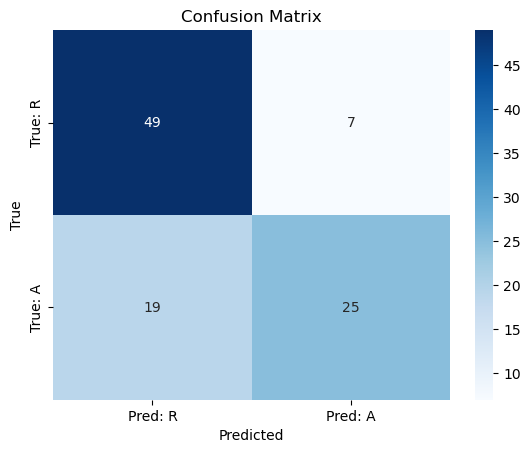

In [65]:
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Pred: R', 'Pred: A'], 
                yticklabels=['True: R', 'True: A'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [66]:
comments = data['text_comments'].tolist()
sampled_comments = random.sample(comments, 2)

In [67]:


for comment in sampled_comments:
    # Tokenize and prepare inputs
    inputs = tokenizer.encode_plus(
        comment,
        return_tensors="pt",
        truncation=True,
        max_length=25
    ).to(device)

    # Get outputs and attentions
    outputs = model(**inputs, output_attentions=True, return_dict=True)
    attention = outputs.attentions

    # Predict class
    logits = outputs.logits
    predicted_class = logits.argmax(dim=-1).item()
    label = "Acceptance" if predicted_class == 1 else "Rejection"

    # Display results
    print(f"Comment: {comment}")
    print(f"Predicted Class: {label}")

    # Visualize attention - Head View
    tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])
    head_view(attention, tokens)

    # Visualize attention - Model View
    model_view(
        attention=attention,
        tokens=tokens,
        sentence_b_start=None,  # Use None for single-sentence inputs
    )


Comment: Pro tip
Pewdiepie's 3 laws of apology
1. Never admit you're wrong
2. Shift blame
3. Play the victim
Predicted Class: Rejection


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Comment: I feel bad for this guy. He obviously meant nothing by it.
Predicted Class: Acceptance


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [68]:


# Tokenize and process the sampled comments
inputs = tokenizer(sampled_comments, padding=True, truncation=True, return_tensors="pt", max_length=512)
inputs = {key: value.to(device) for key, value in inputs.items()}

with torch.no_grad():
    outputs = model(**inputs, output_attentions=True)
    attention = outputs.attentions  # Attention weights

tokens = [tokenizer.convert_ids_to_tokens(input_ids) for input_ids in inputs['input_ids']]
head_view(attention, tokens)

TypeError: sequence item 0: expected str instance, list found